In [1]:
#importing python script having all required libraries imported
# script also contains a function to clean and generate tokenized tweets 
from tweet_cleaning import *

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\akram\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\akram\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\akram\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


In [2]:
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
import pandas as pd
import matplotlib.pyplot as plt
import os, shutil, glob, os.path
from gensim import corpora, models

In [3]:
data = pd.read_csv(r'D:\Projectinsta\coco_captions1.csv')
print(data.shape)
data.head()

(52536, 3)


,country_code,sentence,cluster_no
0,AE,a man in a suit and tie standing in a store.,0
1,AE,a man in a suit and tie standing in front of ...,0
2,AE,a man is standing on the back of a truck.,1
3,AE,a man is standing next to a motorcycle.,1
4,AE,a man is riding a bicycle down a river.,1


In [4]:
country_list=data.country_code.unique().tolist()
len(country_list)

65

In [5]:
maindir = 'E:/insta filter/#covid_19/'
os.chdir(maindir)
#Initialize no. of clusters to zero
number_clusters = 0
onlyfiles = []
images_folders=[]
#Determining the files in the country
for name in country_list:
    ogdir = maindir + name +'/'
    os.chdir(ogdir)
    #changing the directory and finding jpg files
    for file in glob.glob("*.jpg"):
        onlyfiles.append(file)
    images_folders.append(len(onlyfiles))
    onlyfiles=[]
len(images_folders)

65

In [6]:
def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))

def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result
stemmer = SnowballStemmer('english')

In [7]:
clean_sentences = pd.DataFrame(columns=['country_code','sentence','cluster_no'])

In [8]:
for country in country_list:
    per_con = data.loc[(data['country_code'] == country )]
    clusters = per_con.cluster_no.nunique()
    for i in range(clusters+1):
        sentences = per_con.loc[per_con['cluster_no'] == i ,'sentence'].tolist()
        #sentence = ''.join(sentences).strip()
        for s in sentences:
            cleaned = ' '.join(clean(s))
            clean_sentences = clean_sentences.append({'country_code':country,'sentence':cleaned,'cluster_no': i},ignore_index=True)
        #print(sentence)
        #print(cleaned)

In [25]:
print(clean_sentences.shape)
clean_sentences.head()

(52536, 3)


,country_code,sentence,cluster_no
0,AE,man suit tie standing store,0
1,AE,man suit tie standing front building,0
2,AE,man standing back truck,1
3,AE,man standing next motorcycle,1
4,AE,man riding bicycle river,1


In [26]:
import pandas as pd
topics_generated = pd.DataFrame(columns=['country_code','cluster_no','topic_no','topics'])

In [27]:
for country in country_list:
    per_con = clean_sentences.loc[(clean_sentences['country_code'] == country )]
    clusters = per_con.cluster_no.nunique()
    print(country)
    for i in range(clusters+1):
        print('cluster:',i)
        sentences = per_con.loc[((per_con['country_code'] == country)&(per_con['cluster_no'] == i)),'sentence'].tolist()
        #print(sentences)
        processed_docs1 = [preprocess(item) for item in sentences]
        #print(processed_docs1)
        dictionary1 = corpora.Dictionary(processed_docs1)
        bow_corpus = [dictionary1.doc2bow(doc) for doc in processed_docs1]
        tfidf = models.TfidfModel(bow_corpus)
        corpus_tfidf = tfidf[bow_corpus]
        l=len(sentences)
        if l<1:
            continue
        if l<10:
            num_topics = 1
        elif l<30:
            num_topics = 2
        elif l<100:
            num_topics = 5
        else:
            num_topics = 10
        lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus_tfidf,id2word=dictionary1,num_topics=num_topics, random_state=1)
        x = lda_model.print_topics()
        topicwords={}
        for topic,word in x:
            wordlist=(re.sub('[^A-Za-z ]+', '', word)).split()
            topicwords[topic]=wordlist
        #print(topicwords)
        for key,value in topicwords.items():
            topics_generated=topics_generated.append({'country_code':country,'cluster_no':i, 'topic_no': key,'topics':value},ignore_index=True)


AE
cluster: 0
cluster: 1
cluster: 2
cluster: 3
cluster: 4
cluster: 5
cluster: 6
cluster: 7
cluster: 8
AR
cluster: 0
cluster: 1
cluster: 2
cluster: 3
cluster: 4
cluster: 5
cluster: 6
cluster: 7
cluster: 8
cluster: 9
cluster: 10
AT
cluster: 0
cluster: 1
cluster: 2
cluster: 3
cluster: 4
cluster: 5
cluster: 6
AU
cluster: 0
cluster: 1
cluster: 2
cluster: 3
cluster: 4
cluster: 5
cluster: 6
cluster: 7
cluster: 8
cluster: 9
cluster: 10
BE
cluster: 0
cluster: 1
cluster: 2
cluster: 3
cluster: 4
cluster: 5
cluster: 6
BO
cluster: 0
cluster: 1
cluster: 2
cluster: 3
cluster: 4
cluster: 5
cluster: 6
BR
cluster: 0
cluster: 1
cluster: 2
cluster: 3
cluster: 4
cluster: 5
cluster: 6
cluster: 7
cluster: 8
cluster: 9
cluster: 10
CA
cluster: 0
cluster: 1
cluster: 2
cluster: 3
cluster: 4
cluster: 5
cluster: 6
cluster: 7
cluster: 8
cluster: 9
cluster: 10
CH
cluster: 0
cluster: 1
cluster: 2
cluster: 3
cluster: 4
cluster: 5
cluster: 6
CL
cluster: 0
cluster: 1
cluster: 2
cluster: 3
cluster: 4
cluster: 5
cluster: 

In [15]:
print(topics_generated.shape)
topics_generated.head(20)

(2208, 4)


,country_code,cluster_no,topic_no,topics
0,AE,0,0,"[store, build, stand, suit]"
1,AE,1,0,"[truck, motorcycl, stand, rid, bicycl, river]"
2,AE,2,0,"[cell, phone, sign, hold, anim, stuff, charger..."
3,AE,2,1,"[suit, close, snowboard, cell, stand, phone, h..."
4,AE,2,2,"[room, woman, wear, suit, stand, stuff, anim, ..."
5,AE,2,3,"[woman, larg, stand, hydrant, room, white, clo..."
6,AE,2,4,"[pictur, neck, wear, cell, phone, person, hold..."
7,AE,2,5,"[black, white, photo, larg, cell, phone, hand,..."
8,AE,2,6,"[group, stand, peopl, anim, stuff, tabl, sign,..."
9,AE,2,7,"[close, black, background, sign, build, jacket..."


In [16]:
topics_generated.to_csv (r'D:\Projectinsta\caption_topics.csv', header=True, index=False)

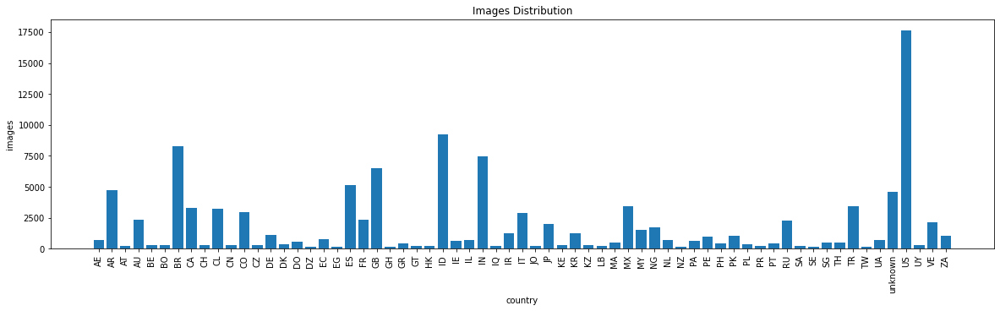

"plt.figure(figsize=(20,10))\ndf = pd.DataFrame({'images': images_folders}, index=country_list)\ndf.plot(kind='barh',figsize=(10, 20))"

In [17]:
plt.figure(figsize=(20,5))
plt.title('Images Distribution')
plt.ylabel('images')
plt.xticks(rotation='vertical')
plt.xlabel('country')
plt.bar(country_list,images_folders)
plt.show()

# Vertical plot
'''plt.figure(figsize=(20,10))
df = pd.DataFrame({'images': images_folders}, index=country_list)
df.plot(kind='barh',figsize=(10, 20))'''

In [18]:
import collections
d = dict(zip(country_list,images_folders))
sorted_dict = sorted(d.items(), key=lambda x: x[1], reverse=True)
top_countries = [i[0] for i in sorted_dict[:11] if i[0]!='unknown']

In [19]:
top_countries

['US', 'ID', 'BR', 'IN', 'GB', 'ES', 'AR', 'TR', 'MX', 'CA']

In [28]:
from IPython.display import display
def cloud(words):
    fig, axes = plt.subplots(2, 5, figsize=(30,4))
    
    for i, ax in enumerate(axes.flatten()):
        fig.add_subplot(ax)
        try:
            topic_words = str(words[i])
            cloud = WordCloud()
            cloud.generate(topic_words)
            fig.subplots_adjust(top = 1.5)
            plt.imshow(cloud)
            #plt.show()
            plt.gca().set_title('Cluster ' + str(i), fontsize=30)
            plt.gca().axis('off')
        except IndexError:
            fig.delaxes(ax)
    #plt.imshow(cloud)
    plt.show()
    print('***************************************************************************')

Country :  AE


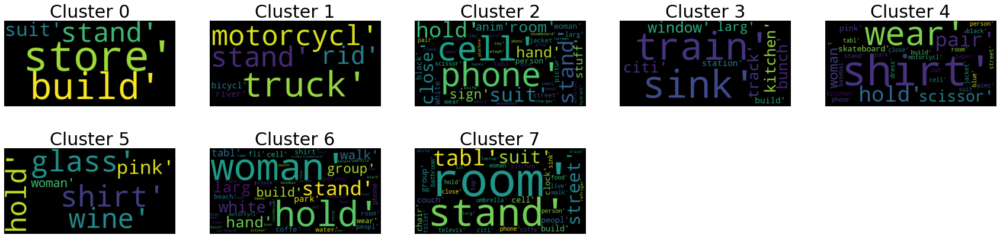

***************************************************************************
Country :  AR


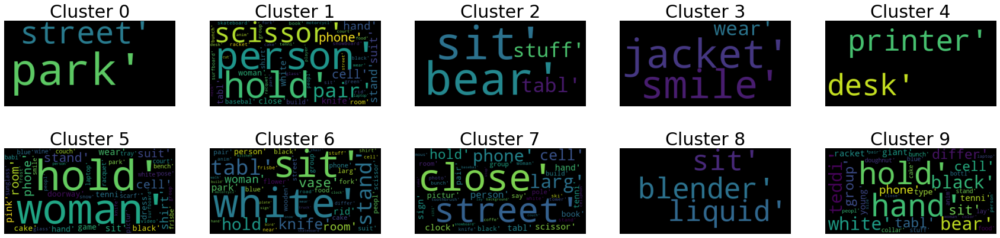

***************************************************************************
Country :  AT


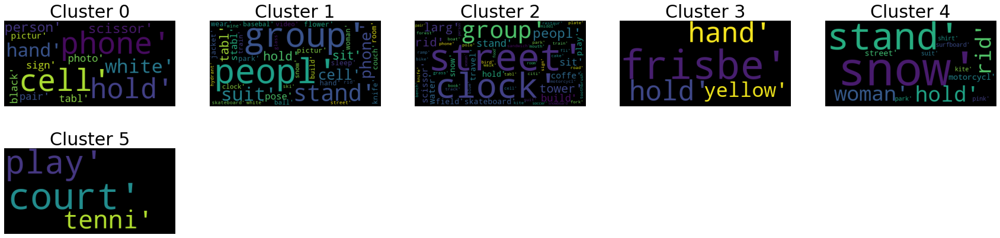

***************************************************************************
Country :  AU


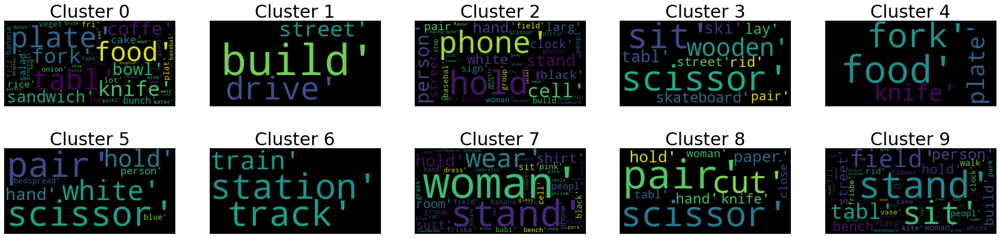

***************************************************************************
Country :  BE


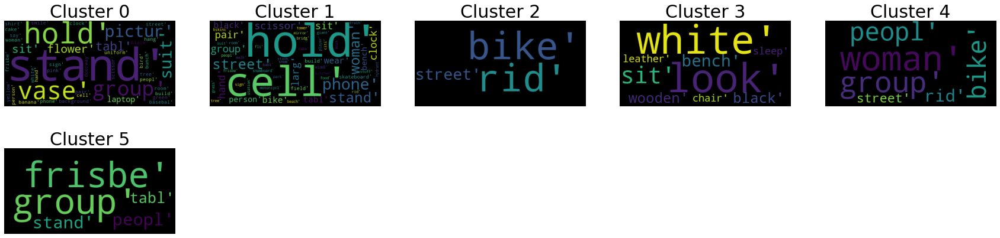

***************************************************************************
Country :  BO


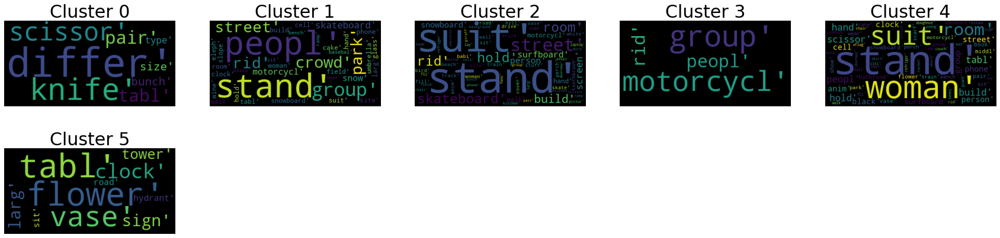

***************************************************************************
Country :  BR


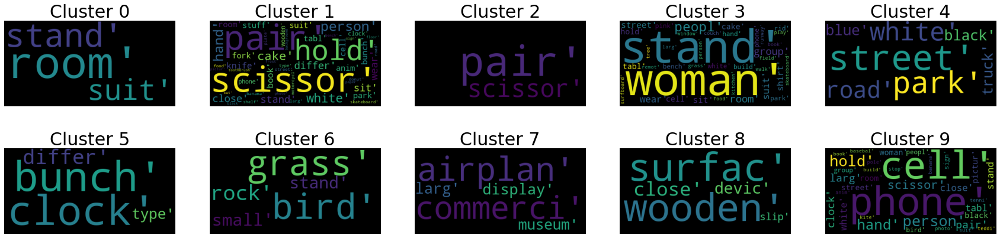

***************************************************************************
Country :  CA


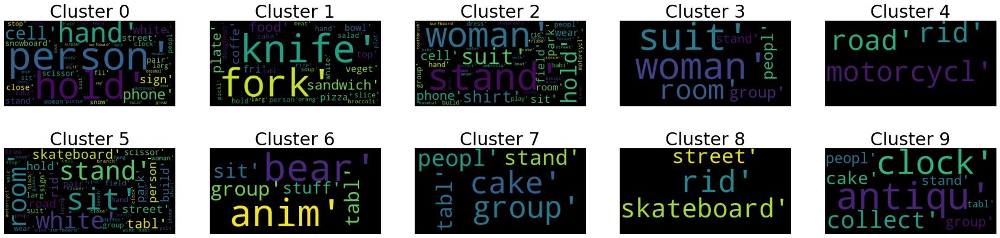

***************************************************************************
Country :  CH


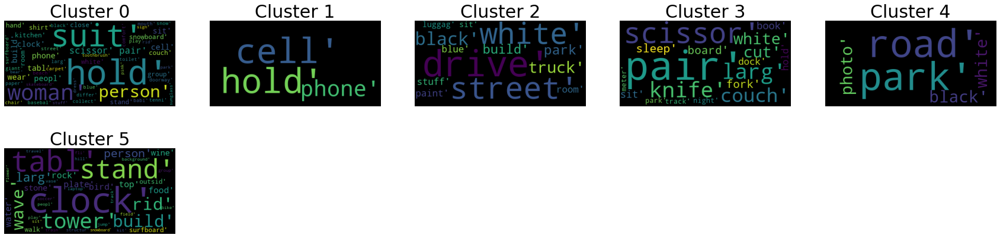

***************************************************************************
Country :  CL


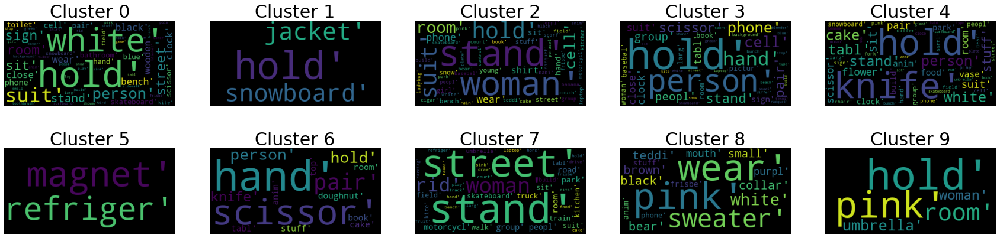

***************************************************************************
Country :  CN


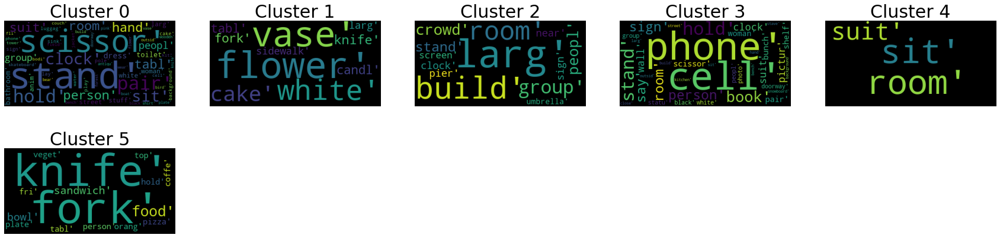

***************************************************************************
Country :  CO


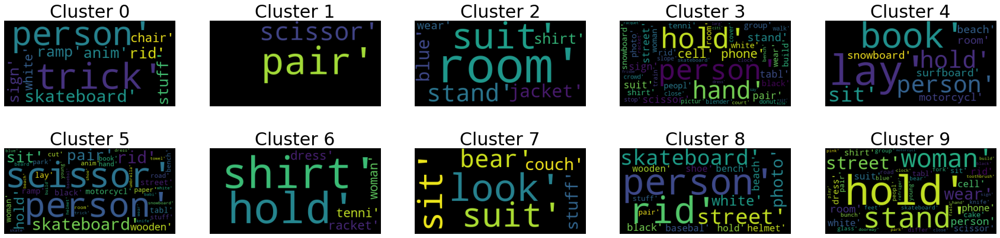

***************************************************************************
Country :  CZ


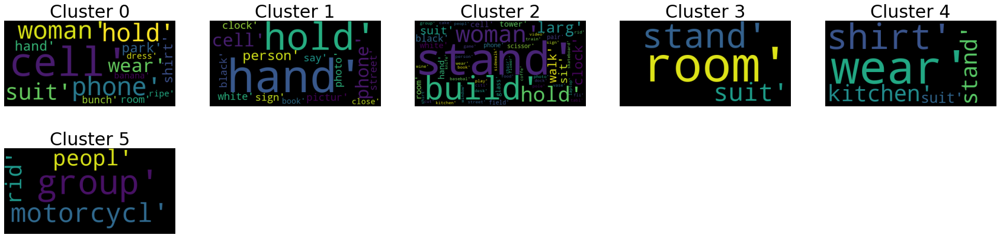

***************************************************************************
Country :  DE


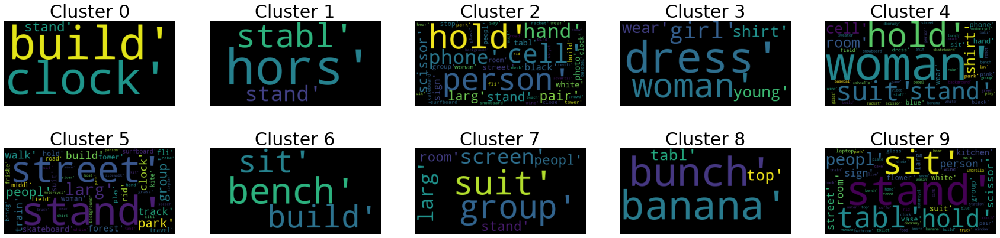

***************************************************************************
Country :  DK


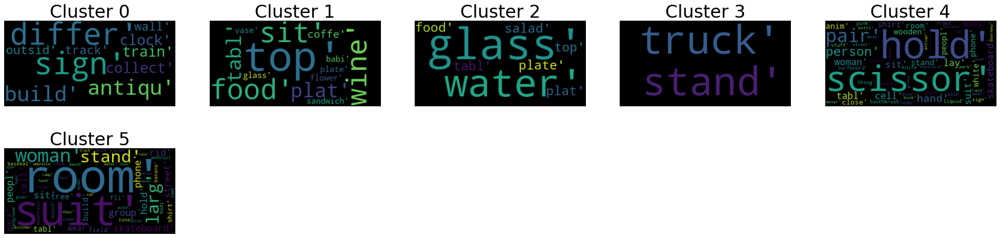

***************************************************************************
Country :  DO


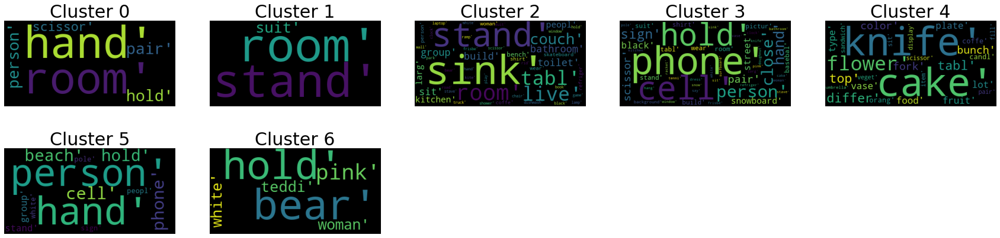

***************************************************************************
Country :  DZ


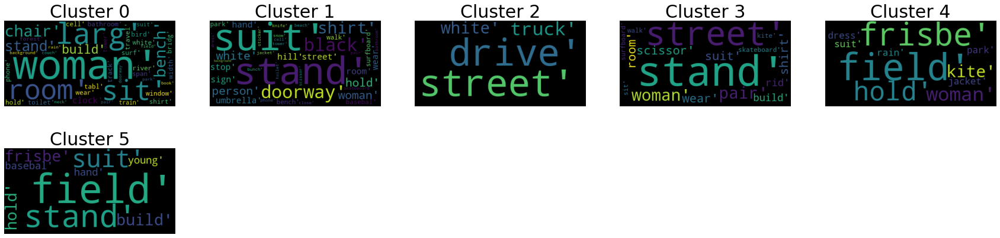

***************************************************************************
Country :  EC


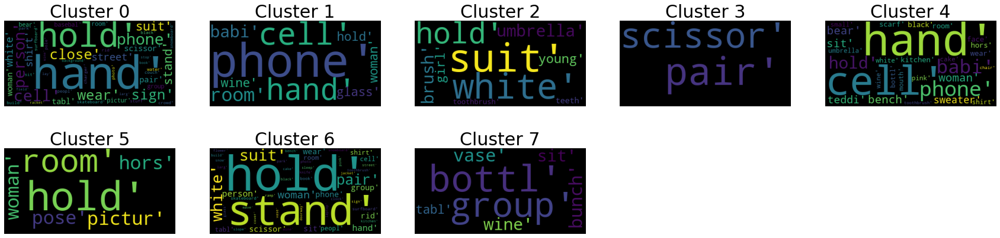

***************************************************************************
Country :  EG


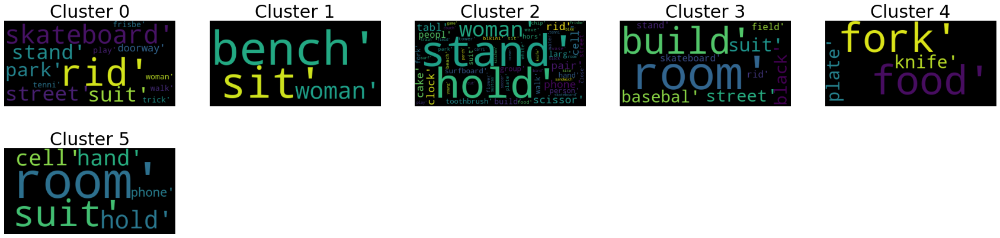

***************************************************************************
Country :  ES


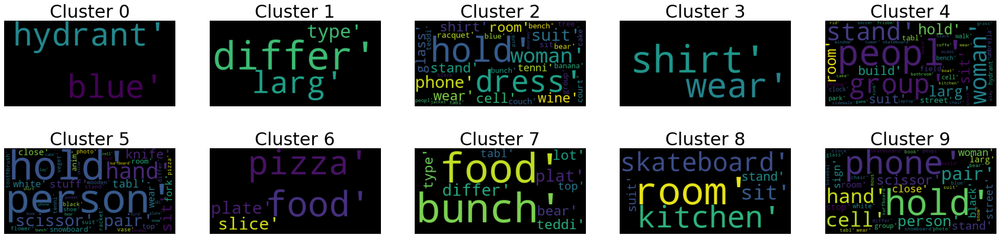

***************************************************************************
Country :  FR


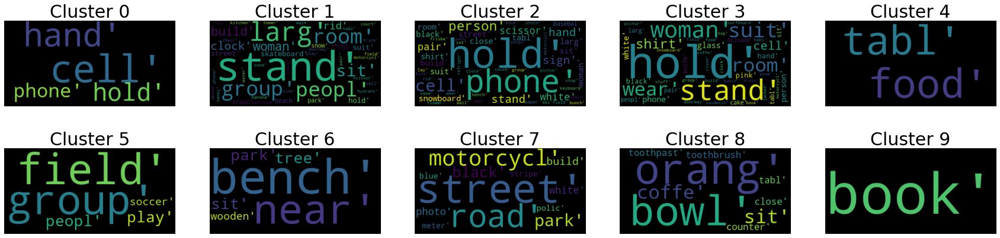

***************************************************************************
Country :  GB


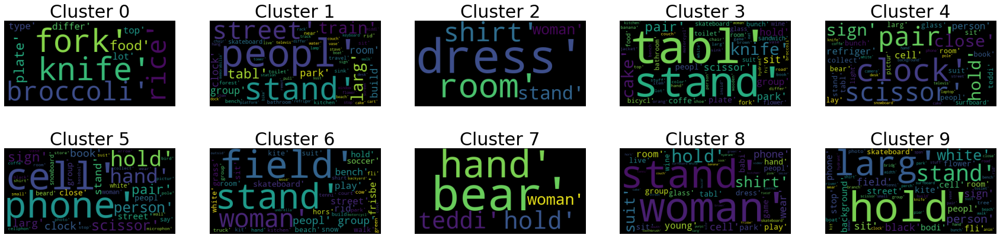

***************************************************************************
Country :  GH


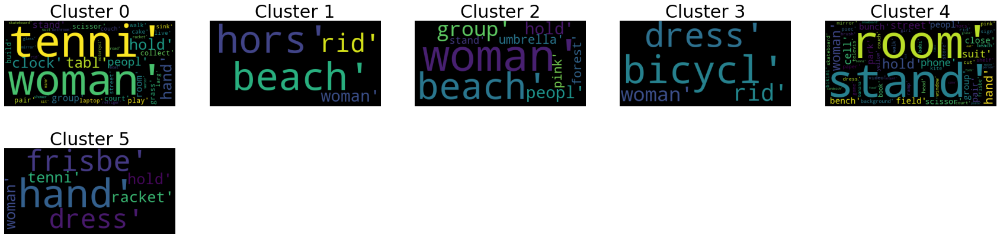

***************************************************************************
Country :  GR


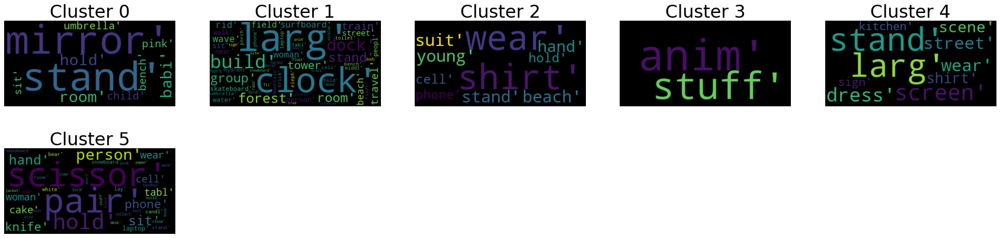

***************************************************************************
Country :  GT


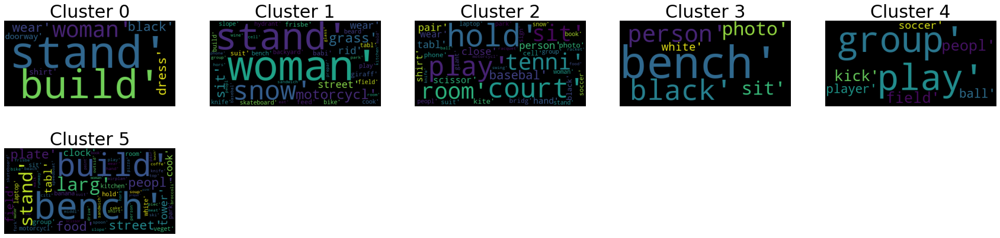

***************************************************************************
Country :  HK


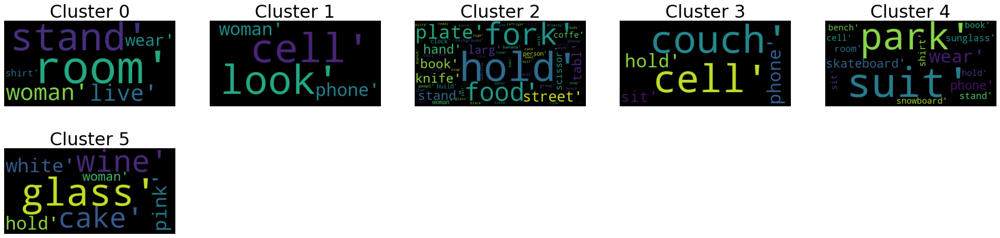

***************************************************************************
Country :  ID


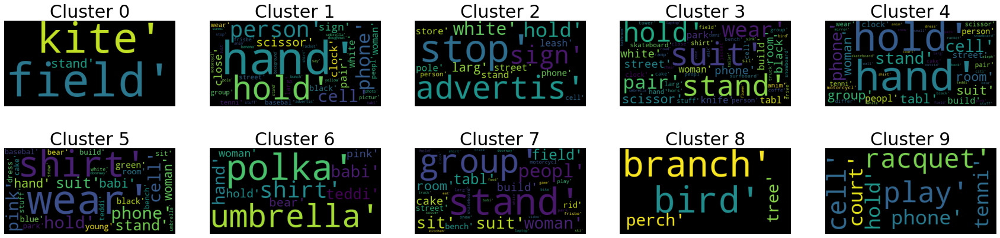

***************************************************************************
Country :  IE


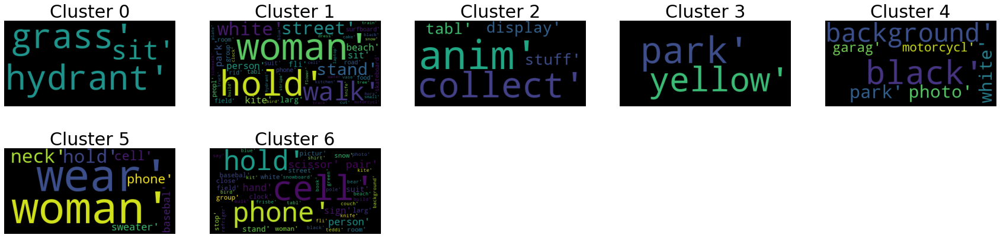

***************************************************************************
Country :  IL


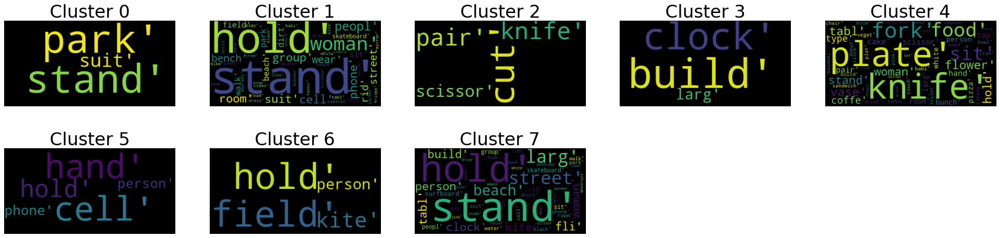

***************************************************************************
Country :  IN


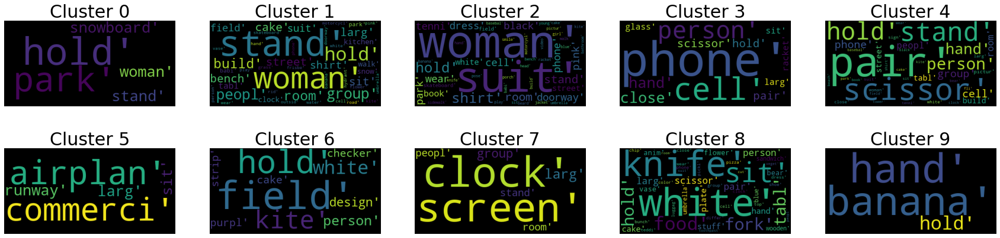

***************************************************************************
Country :  IQ


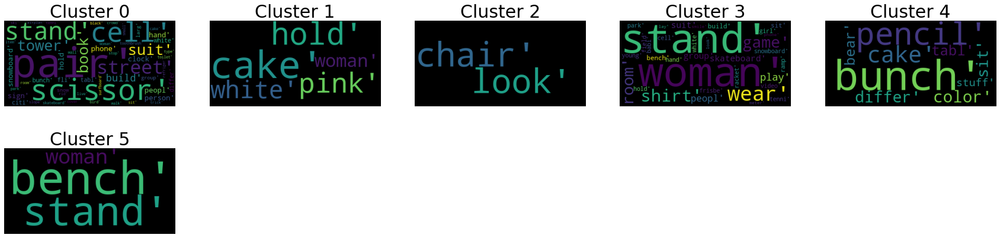

***************************************************************************
Country :  IR


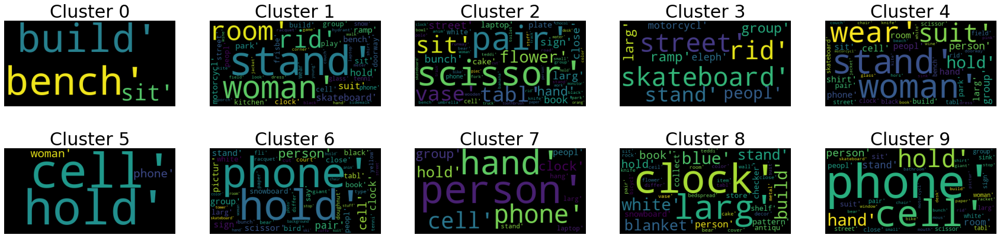

***************************************************************************
Country :  IT


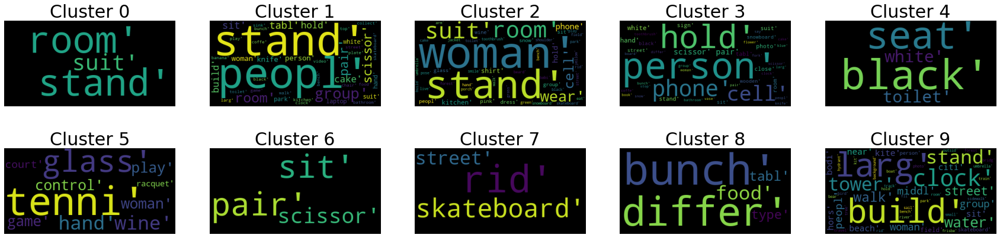

***************************************************************************
Country :  JO


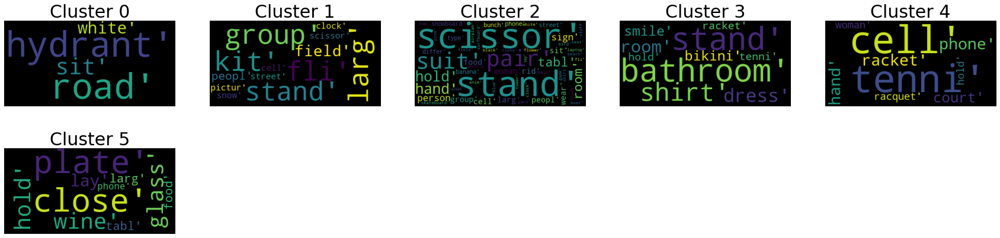

***************************************************************************
Country :  JP


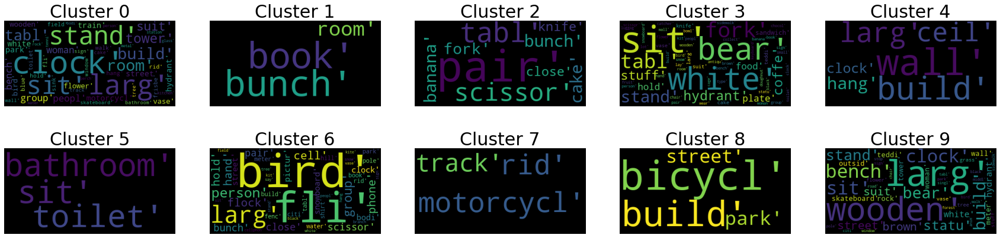

***************************************************************************
Country :  KE


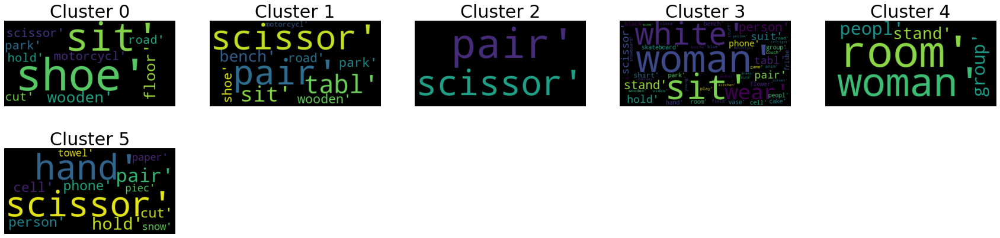

***************************************************************************
Country :  KR


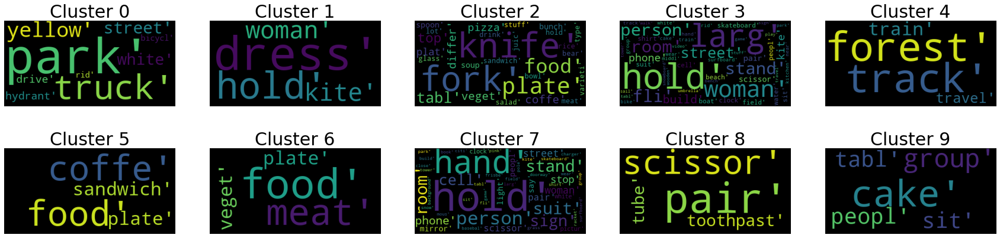

***************************************************************************
Country :  KZ


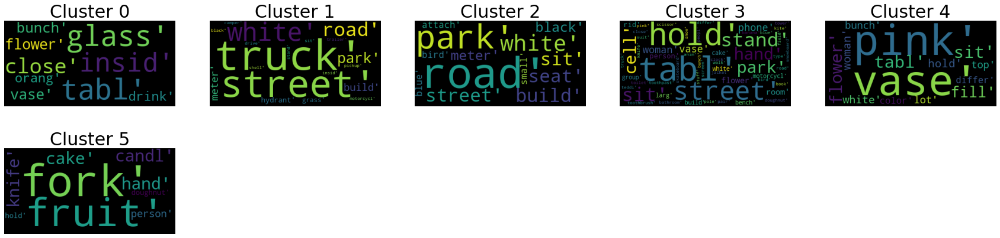

***************************************************************************
Country :  LB


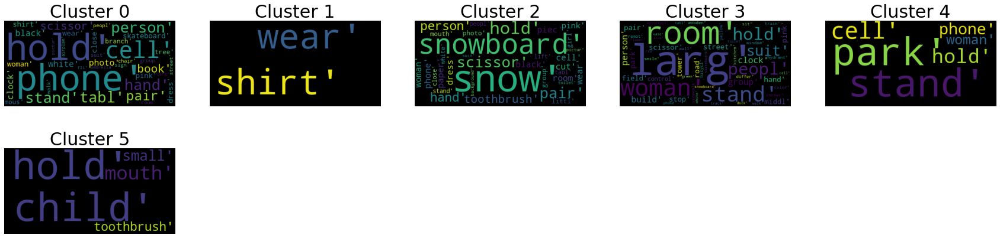

***************************************************************************
Country :  MA


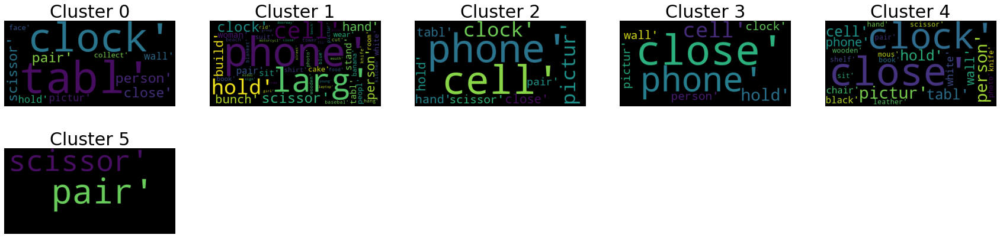

***************************************************************************
Country :  MX


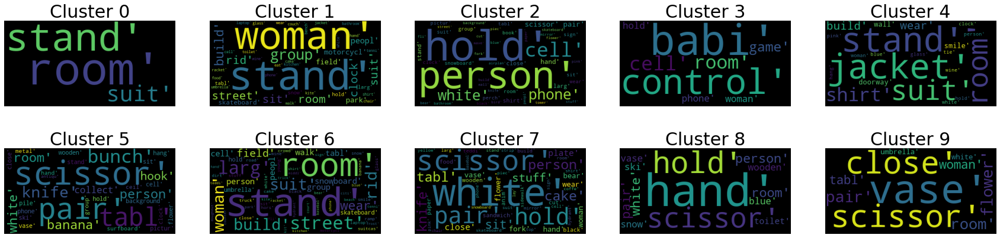

***************************************************************************
Country :  MY


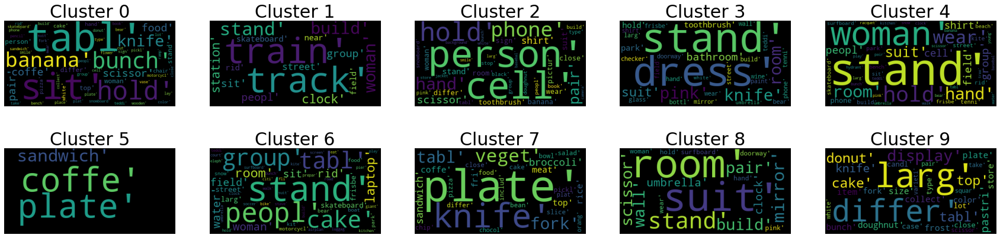

***************************************************************************
Country :  NG


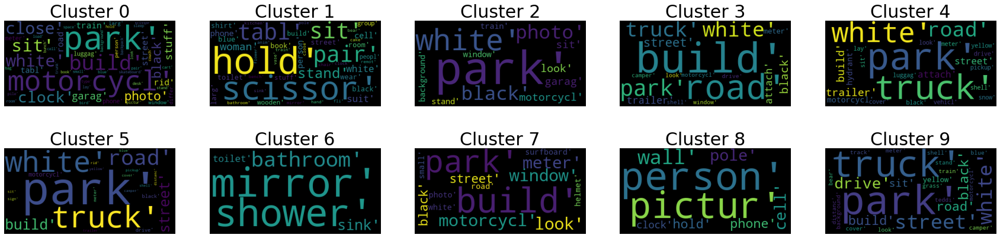

***************************************************************************
Country :  NL


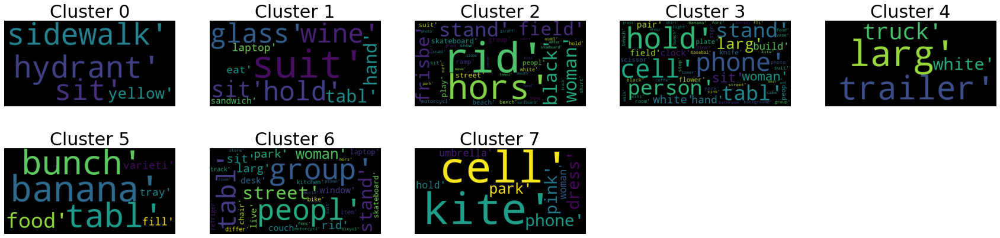

***************************************************************************
Country :  NZ


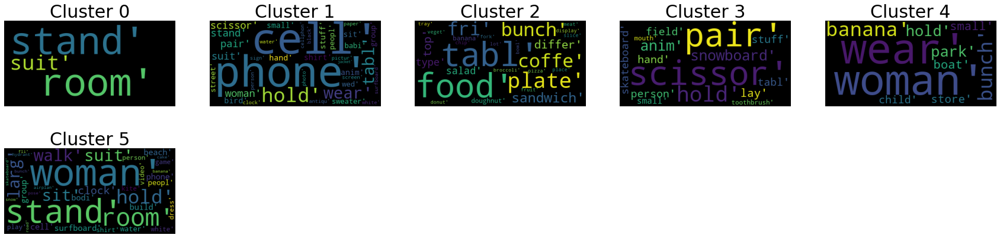

***************************************************************************
Country :  PA


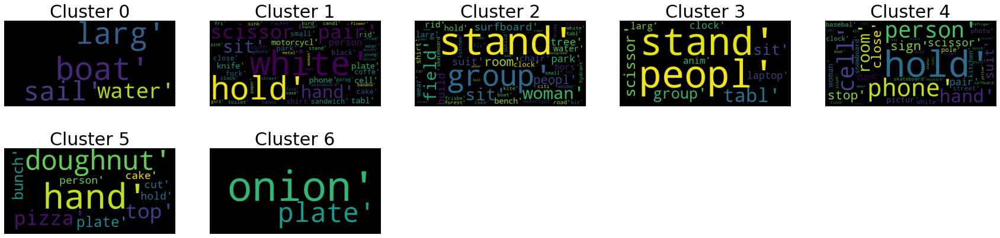

***************************************************************************
Country :  PE


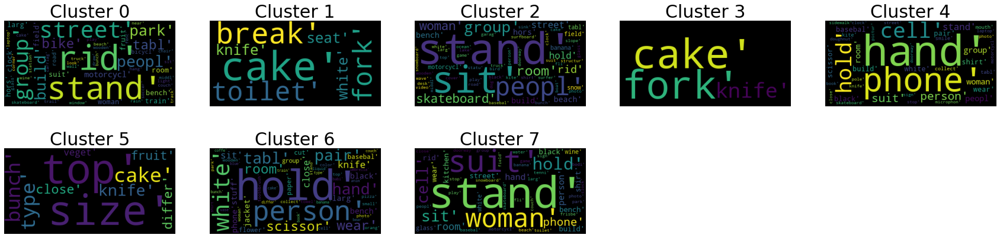

***************************************************************************
Country :  PH


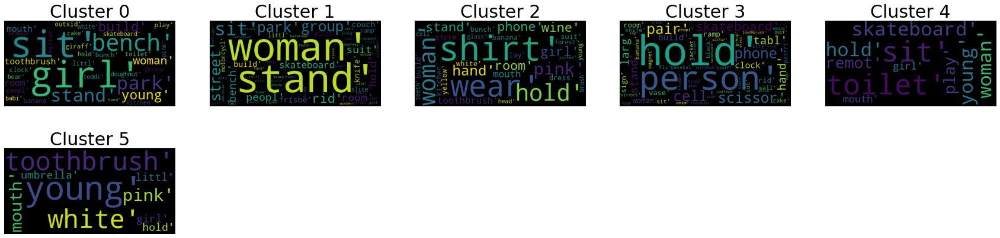

***************************************************************************
Country :  PK


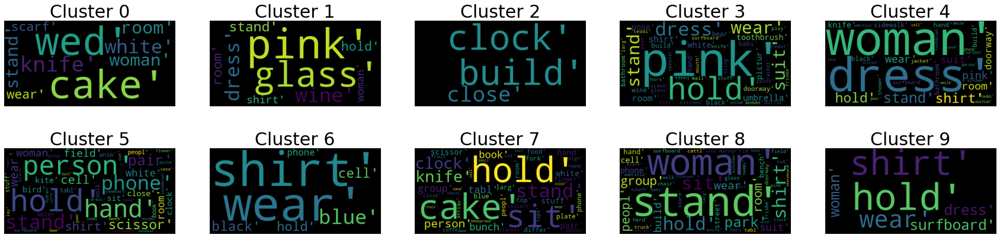

***************************************************************************
Country :  PL


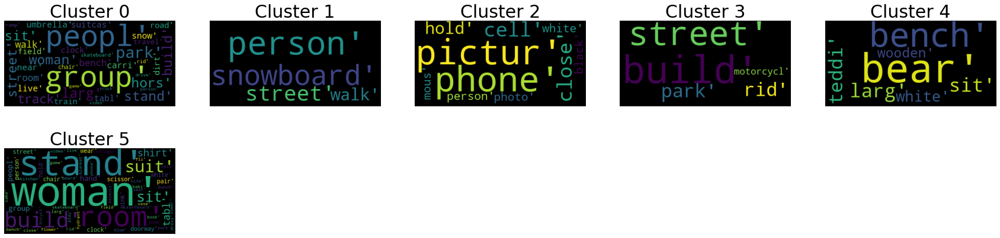

***************************************************************************
Country :  PR


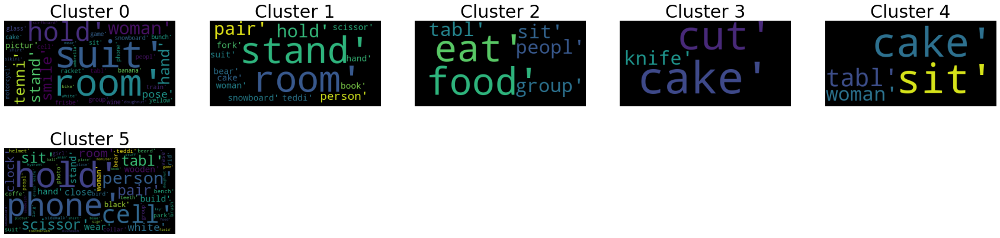

***************************************************************************
Country :  PT


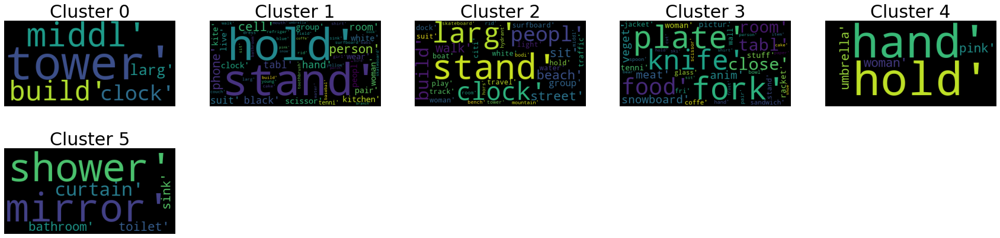

***************************************************************************
Country :  RU


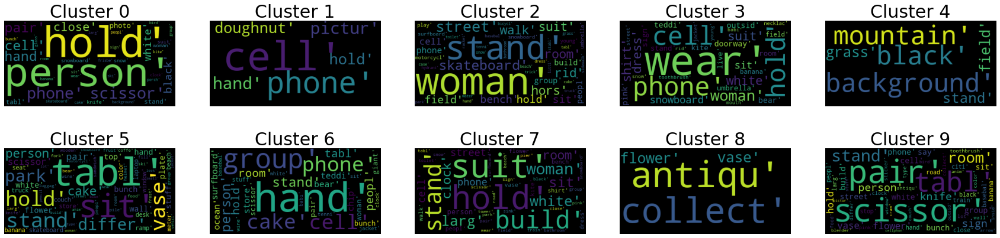

***************************************************************************
Country :  SA


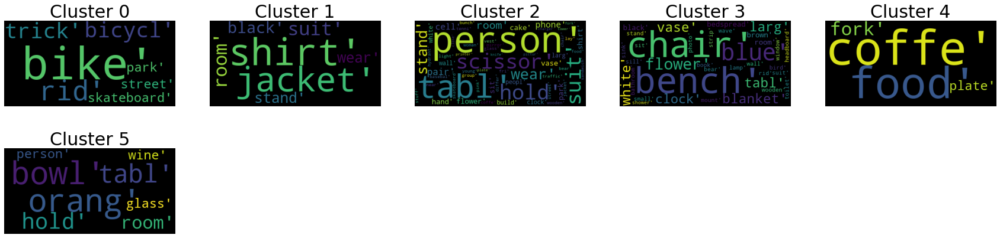

***************************************************************************
Country :  SE


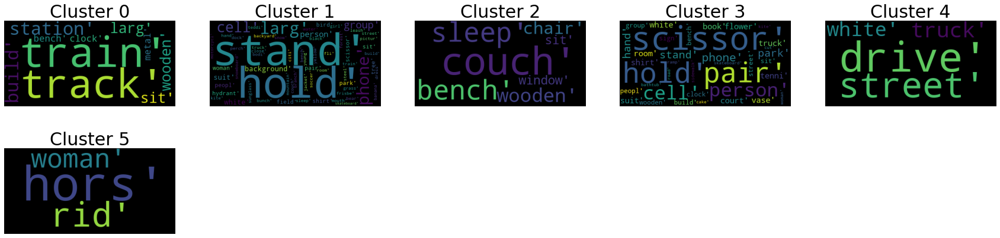

***************************************************************************
Country :  SG


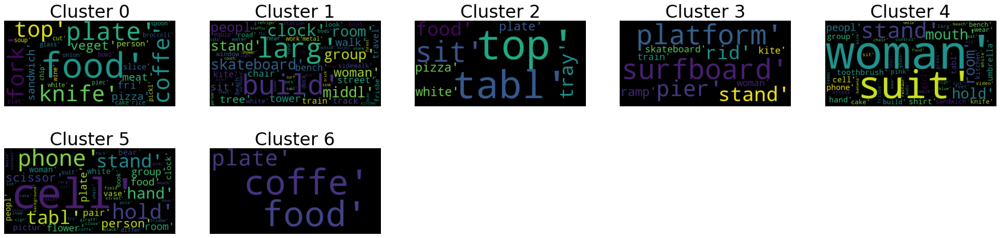

***************************************************************************
Country :  TH


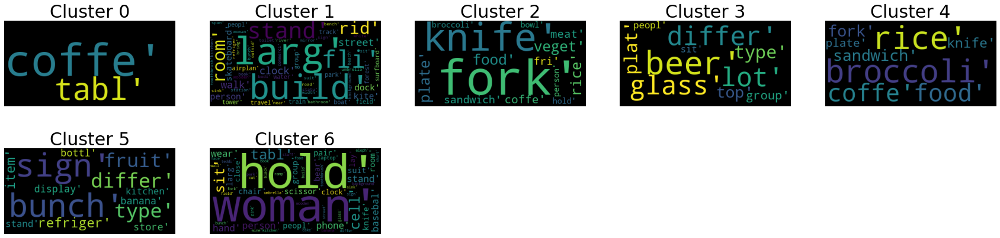

***************************************************************************
Country :  TR


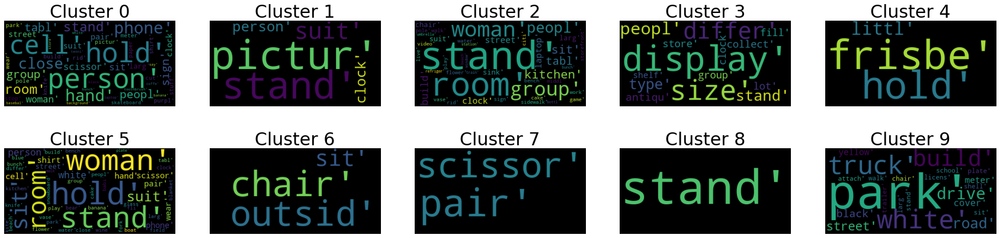

***************************************************************************
Country :  TW


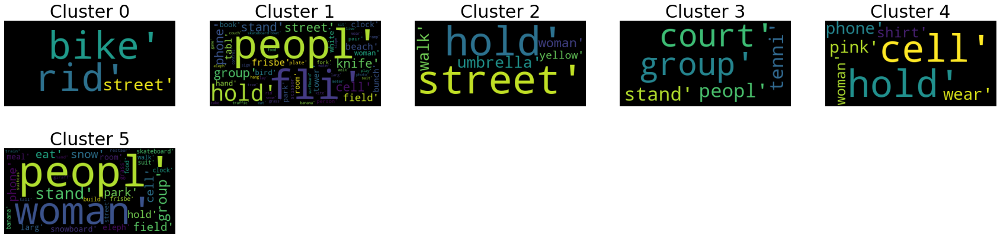

***************************************************************************
Country :  UA


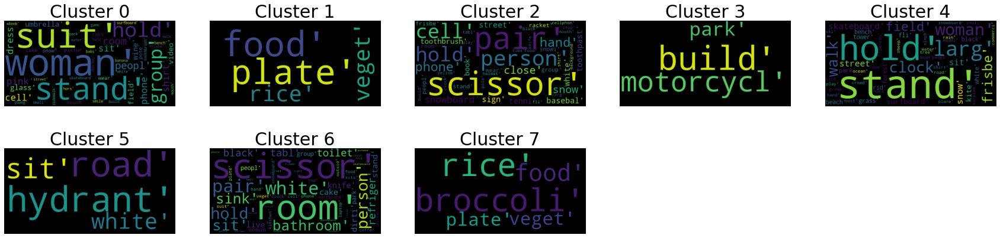

***************************************************************************
Country :  unknown


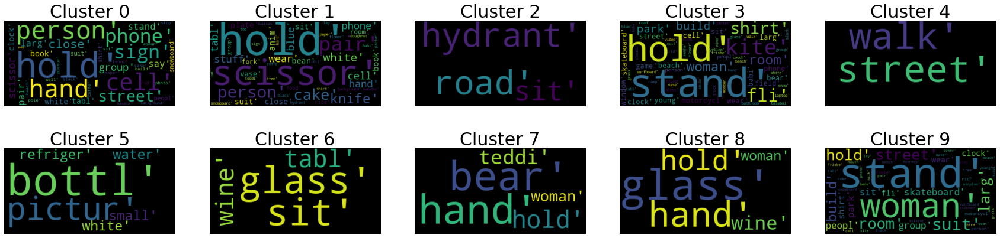

***************************************************************************
Country :  US


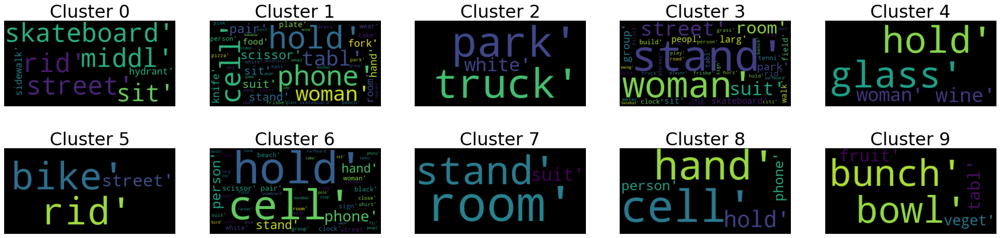

***************************************************************************
Country :  UY


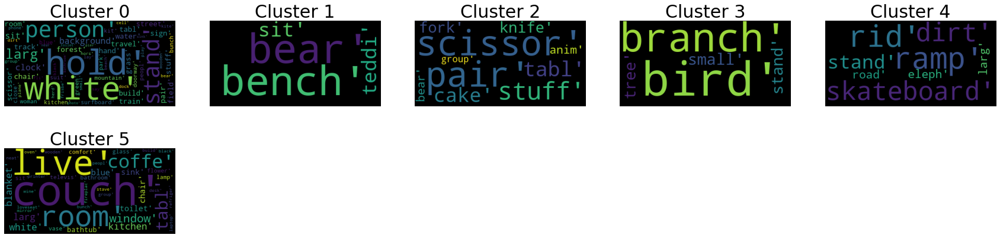

***************************************************************************
Country :  VE


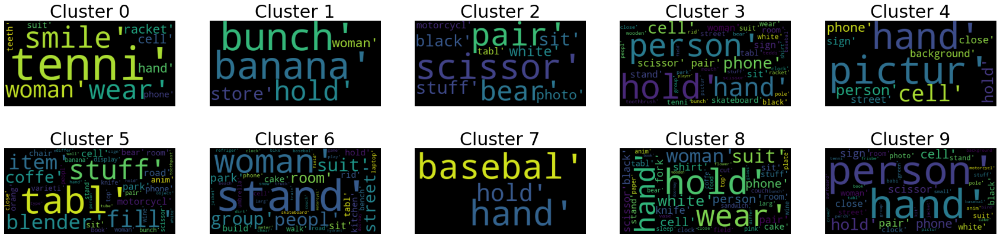

***************************************************************************
Country :  ZA


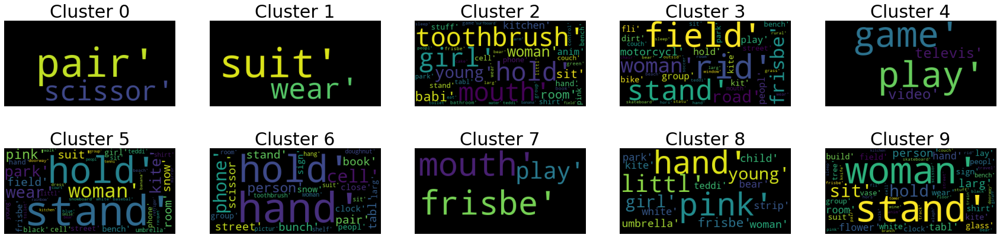

***************************************************************************


In [31]:
from wordcloud import WordCloud
%matplotlib inline
for country in country_list:
    per_con = topics_generated.loc[(topics_generated['country_code'] == country )]
    clusters = per_con.cluster_no.nunique()
    wordlist=[]
    for i in range(clusters+1):
        samp = topics_generated.loc[(topics_generated['country_code']==country) & (topics_generated['cluster_no']==i),['topics']]['topics'].tolist()
        if len(samp)<1:
            continue
        flat_list = [item for sublist in samp for item in sublist]
        wordlist.append(flat_list)
    print('Country : ', country)
    cloud(wordlist)